100%|██████████| 20/20 [00:09<00:00,  2.18it/s]


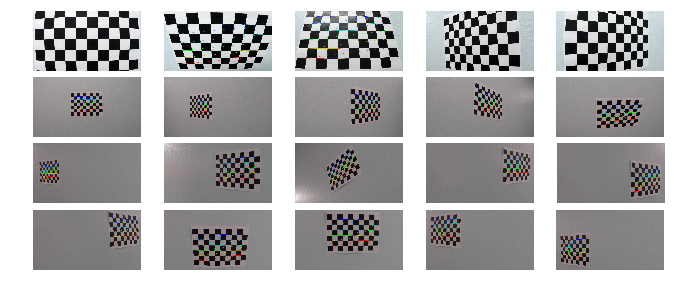

In [1]:
from tqdm import tqdm
from glob import glob
import cv2

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

%matplotlib inline

img_list = sorted(glob('camera_cal/*.jpg'), key = lambda x: int(x.split('.')[0].split('n')[1]))

n_cols = 5
n_rows = (len(img_list)+n_cols-1)//n_cols

fig = plt.figure(figsize=(n_cols*2,n_rows))
gs = gridspec.GridSpec(n_rows, n_cols*2, top=1., bottom=0.1, right=1., left=0.1, hspace=0.1, wspace=0.1)

imgpoints, objpoints = [], []

nx, ny = 9, 6
objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

for i in tqdm(range(len(img_list))):
    img = cv2.imread(img_list[i])
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret:
        imgpoints.append(corners)
        objpoints.append(objp)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

    ax = plt.subplot(gs[i*2:i*2+2])
    plt.imshow(img)
    plt.axis('off')
            

In [2]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape,None,None)
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

100%|██████████| 20/20 [00:02<00:00,  6.98it/s]


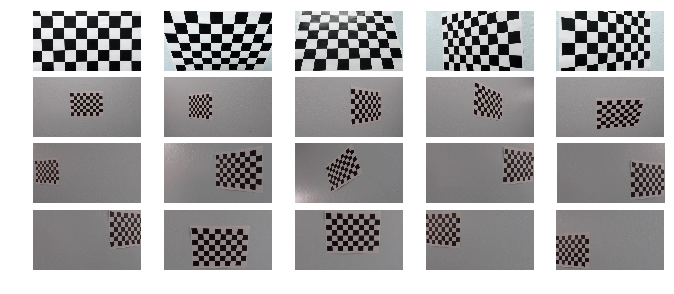

In [3]:
n_cols = 5
n_rows = (len(img_list)+n_cols-1)//n_cols

fig = plt.figure(figsize=(n_cols*2,n_rows))
gs = gridspec.GridSpec(n_rows, n_cols*2, top=1., bottom=0.1, right=1., left=0.1, hspace=0.1, wspace=0.1)

for i in tqdm(range(len(img_list))):
    img = cv2.imread(img_list[i])
    dst = undistort(img)

    ax = plt.subplot(gs[i*2:i*2+2])
    plt.imshow(dst)
    plt.axis('off')


In [9]:
def scaled(x, maximum=255, outtype=np.uint8):
    return (x*255/np.max(x)).astype(outtype)

def mask_thresh(x, thresh):
    return (x >= thresh[0]) & (x <= thresh[1])

def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100), sy_thresh=(20,100), sl_thresh=(40,100), sd_thresh = (0.7,1.3)):
    img = np.copy(img)
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    r_channel = img[:,:,2]
    g_channel = img[:,:,1]
    
    # Sobel
    sobelx = np.absolute(cv2.Sobel(l_channel, cv2.CV_64F, 1, 0)) # Take the derivative in x
    sobely = np.absolute(cv2.Sobel(l_channel, cv2.CV_64F, 0, 1)) # Take the derivative in y
    sobell = np.sqrt(sobelx**2 + sobely**2) # length of the gradient
    
    
    sobeld = np.arctan2(np.absolute(cv2.Sobel(l_channel, cv2.CV_64F, 0, 1, ksize=15)), 
                        np.absolute(cv2.Sobel(l_channel, cv2.CV_64F, 1, 0, ksize=15))) # direction of the gradient
    
    mask_sx = mask_thresh(scaled(sobelx), sx_thresh)
    mask_sy = mask_thresh(scaled(sobely), sy_thresh)
    mask_sl = mask_thresh(scaled(sobell), sl_thresh)
    mask_sd = mask_thresh(sobeld, sd_thresh)
    mask_sxy = (mask_sx & mask_sy) 
    mask_sld = (mask_sl & mask_sd)

    mask_s = mask_thresh(s_channel, s_thresh)
    mask_r = mask_thresh(r_channel, (200,255))
    mask_g = mask_thresh(g_channel, (200,255))
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    ooo = np.zeros_like(mask_sx).astype(np.int8)
    color_binary = np.dstack((mask_sxy, mask_sld, mask_s | (mask_r & mask_g)))
    return color_binary


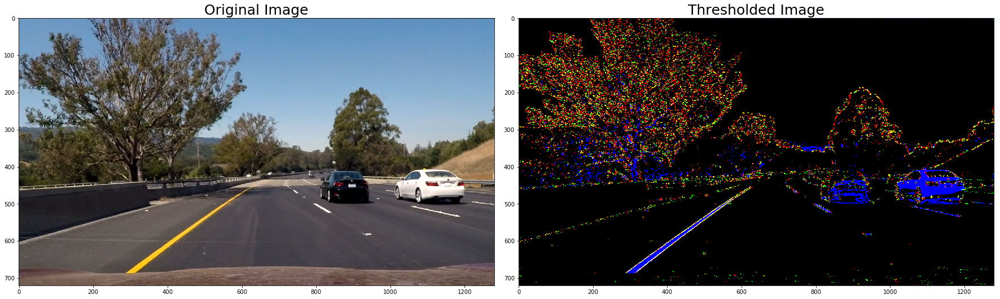

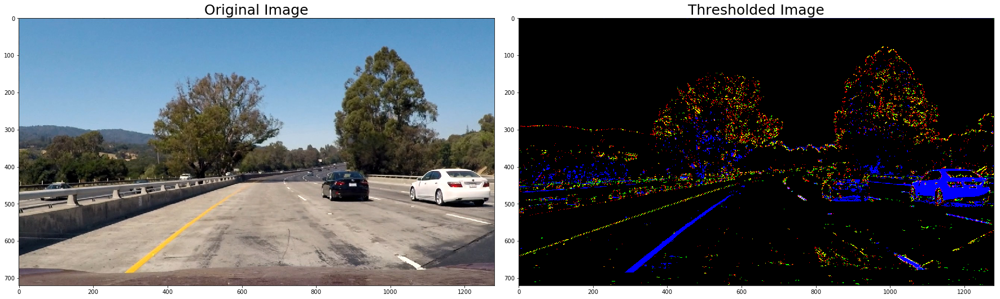

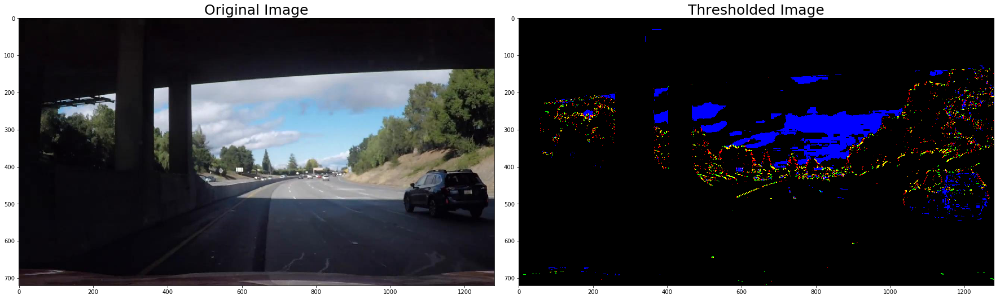

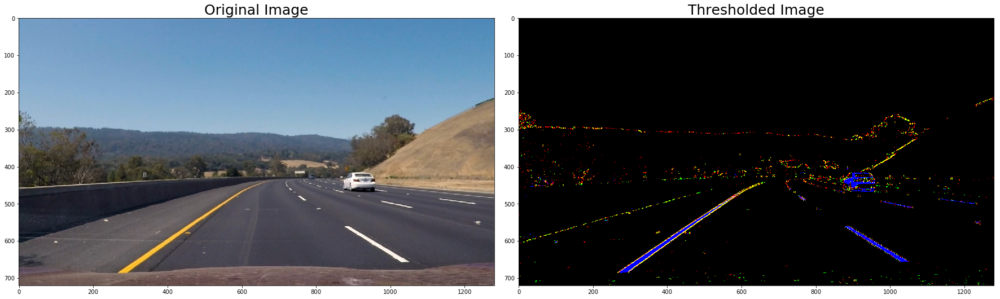

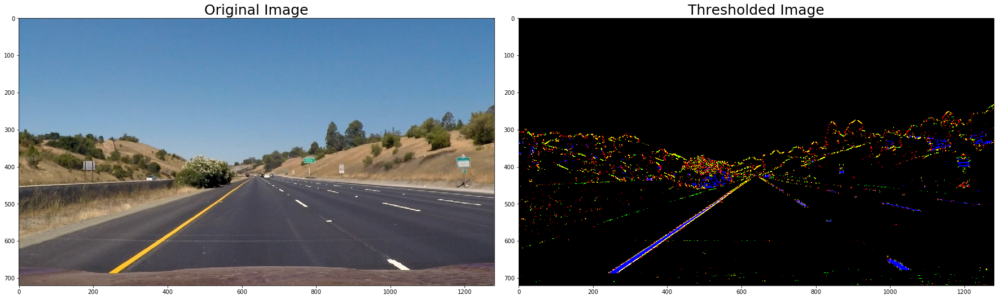

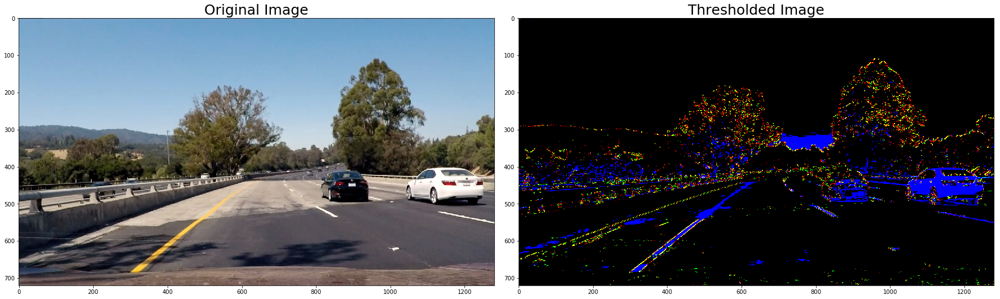

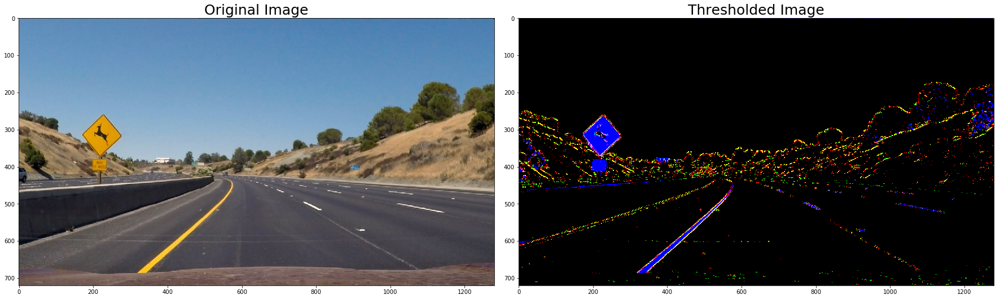

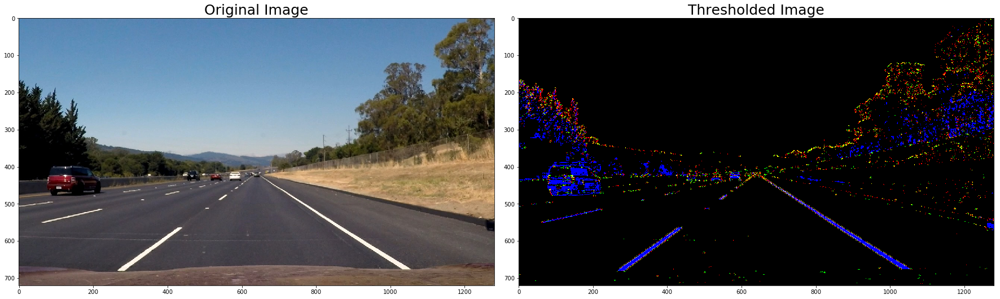

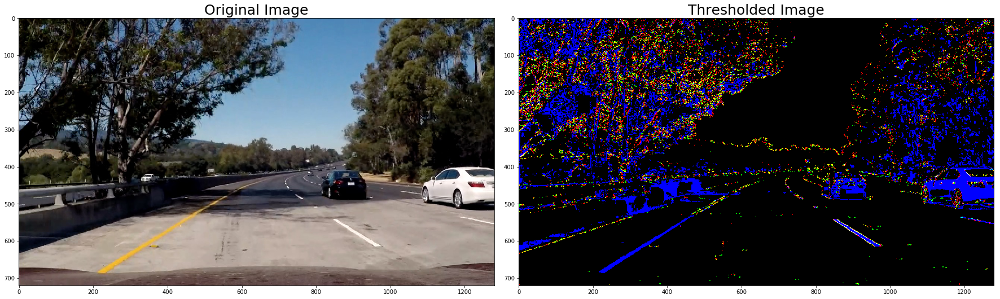

In [10]:
def RGB(img):
    return cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB)

img_list = glob('test_images/*.jpg')

for img_name in img_list:
    img = cv2.imread(img_name)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(RGB(img))
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(pipeline(img).astype(np.float32))
    ax2.set_title('Thresholded Image', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.figure()

In [140]:
!ls test_images/

shadow1.jpg	     straight_lines2.jpg  test2.jpg  test4.jpg	test6.jpg
straight_lines1.jpg  test1.jpg		  test3.jpg  test5.jpg


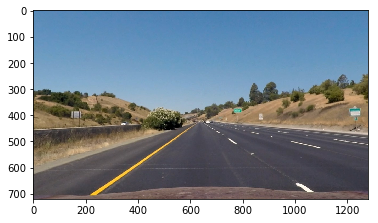

In [12]:
%matplotlib inline
straight_line_img = cv2.cvtColor(cv2.imread('test_images/straight_lines1.jpg'), cv2.COLOR_BGR2RGB)
undistort_img = cv2.undistort(straight_line_img, mtx, dist, None, mtx)
plt.imshow(undistort_img)

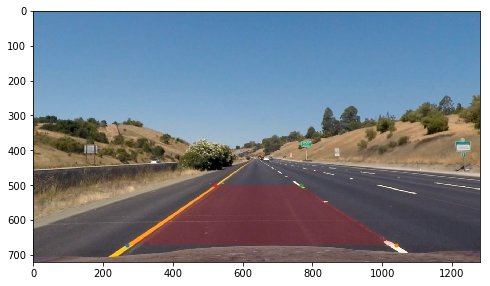

In [13]:
plt.figure(num=None, figsize=(8, 6))
source_points = [(267, 670), (1038, 670), (768,500), (520,500)]
warped_points = [(267, 670), (1028, 670), (1028,550), (267,550)]
img = undistort_img.copy()
cv2.fillConvexPoly(img, np.array(source_points), [255,0,0])
img = cv2.addWeighted(img, 0.2, undistort_img, 0.8, 0)
plt.imshow(img)
for p in source_points:
    plt.plot(*p, '.')

In [14]:
source_points = np.float32(source_points)
warped_points = np.float32(warped_points)
M = cv2.getPerspectiveTransform(source_points, warped_points)
Minv = cv2.getPerspectiveTransform(warped_points, source_points)

def birdeye(img):
    return cv2.warpPerspective(img, M, img.shape[:2][::-1], flags=cv2.INTER_LINEAR)

def careye(img):
    return cv2.warpPerspective(img, Minv, img.shape[:2][::-1], flags=cv2.INTER_LINEAR)

def process(img):
    undistort_img = undistort(img)
    pipline_img = pipeline(undistort_img, s_thresh=(90,255), sx_thresh=(20, 255), sl_thresh=(20,255), sd_thresh=(0.7,1.3)).astype(np.float32)
    birdeye_img = birdeye(pipline_img)
    return birdeye_img
    

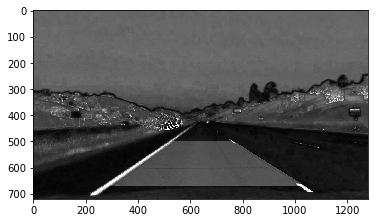

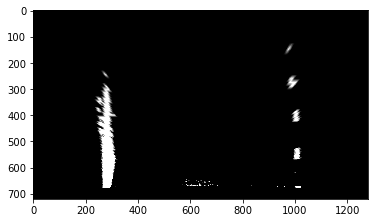

In [15]:
hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
plt.imshow(hls[:,:,2], cmap='gray')
plt.figure()
plt.imshow(process(img)[:,:,2], cmap='gray')

In [16]:
# Choose the number of sliding windows
nwindows = 9

# Set the width of the windows +/- margin
margin = 100

# Set minimum number of pixels found to recenter window
minpix = 50    

deg = 2


In [17]:
def find_lanes_with_sliding_windows(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]*4//5:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = histogram.shape[0]//2
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzeroy, nonzerox = binary_warped.nonzero()

    # Current positions to be updated for each window
    leftx_current, rightx_current = leftx_base, rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds, right_lane_inds = [], []    
    
    # Create an output image to draw on and  visualize the result
    out_img = np.array(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, deg, w=lefty)
    right_fit = np.polyfit(righty, rightx, deg, w=righty)
    
    fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

#     fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
#     fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]
    fit_leftx = np.polyval(left_fit, fity)
    fit_rightx = np.polyval(right_fit, fity)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx)


In [33]:
np.cumsum(img.shape

(720, 1280, 3)

In [21]:
def find_lands_with_fit_poly(binary_warped, left_fit, right_fit):
    nonzeroy, nonzerox = binary_warped.nonzero()

    fit_leftx = np.polyval(left_fit, nonzeroy)
    fit_rightx = np.polyval(right_fit, nonzeroy)
#     fit_leftx = left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2]
#     fit_rightx = right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2]
    
    left_lane_inds = np.abs(nonzerox - fit_leftx) < margin
    right_lane_inds = np.abs(nonzerox - fit_rightx) < margin

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, deg, w=lefty)
    right_fit = np.polyfit(righty, rightx, deg,w=righty)
    
    # Generate x and y values for plotting
    fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
#     fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]
    fit_leftx = np.polyval(left_fit, fity)
    fit_rightx = np.polyval(right_fit, fity)
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([fit_leftx-margin, fity]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([fit_leftx+margin, fity])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([fit_rightx-margin, fity]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([fit_rightx+margin, fity])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return left_fit, right_fit, result, (fity, fit_leftx, fit_rightx)


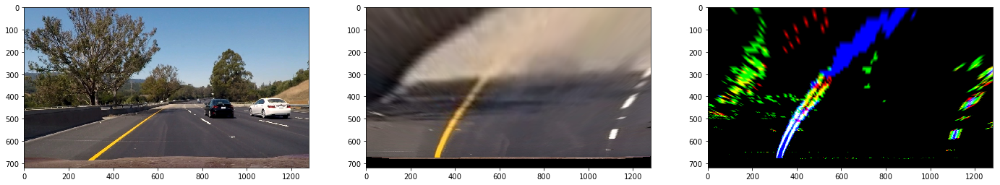

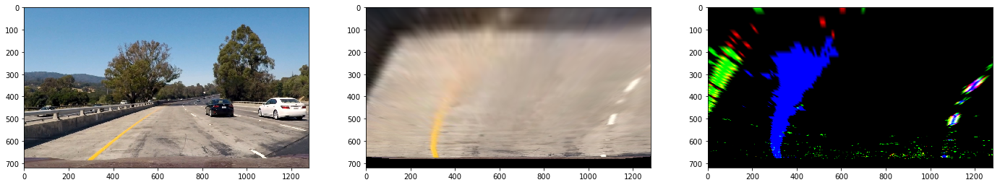

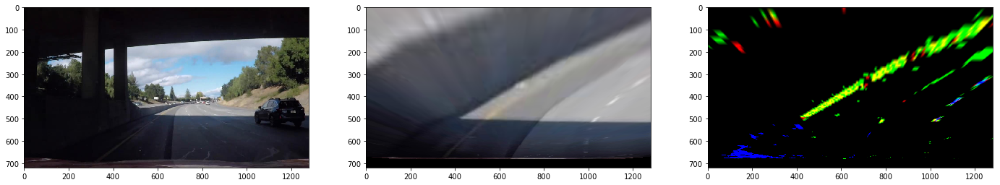

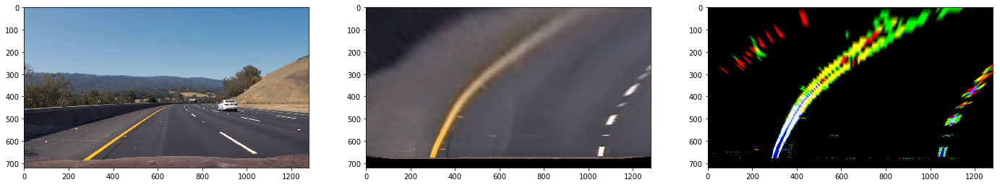

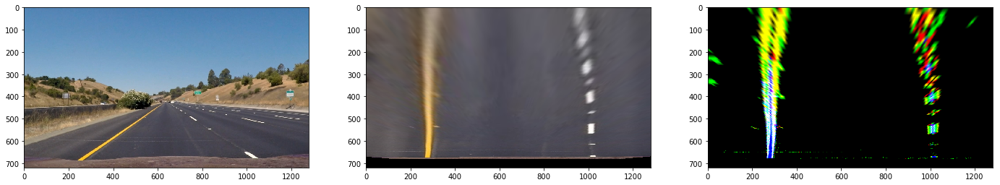

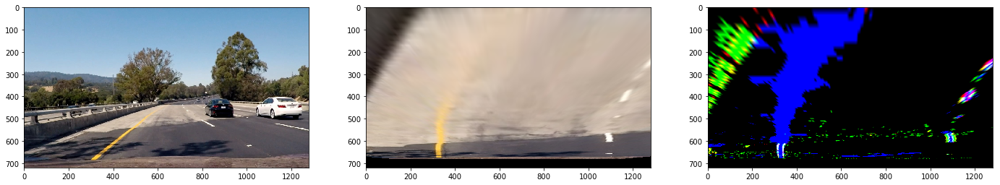

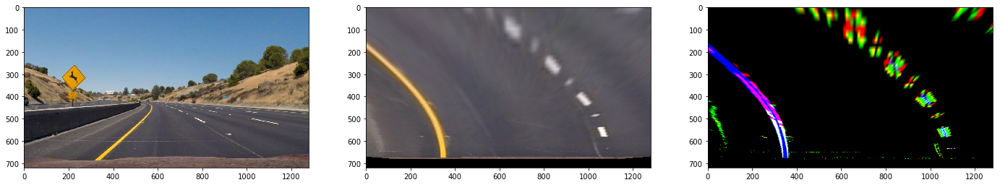

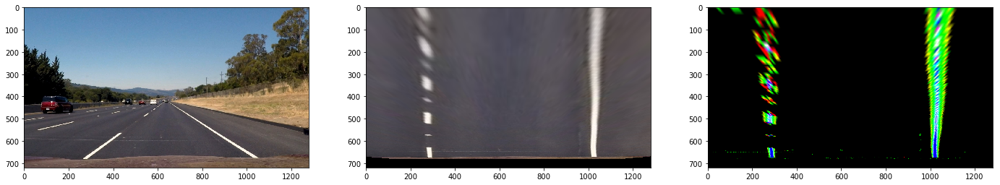

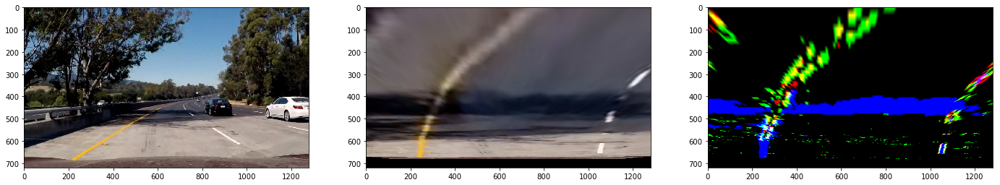

In [18]:
for img_name in glob('test_images/*.jpg'):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    img = cv2.imread(img_name)
    imgRGB = RGB(img)
    birdeye_img = birdeye(imgRGB)
    ax1.imshow(imgRGB)
    ax2.imshow(birdeye_img)
    ax3.imshow(process(img))
    plt.figure()

(720, 0)

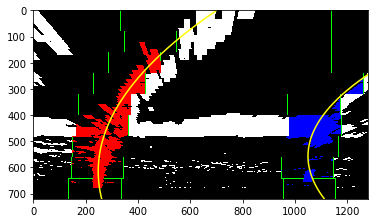

In [19]:
processed_img = np.any(process(img), axis=-1)
# plt.imshow(processed_img.astype(np.float32), cmap='gray')
left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lanes_with_sliding_windows(processed_img.astype(np.uint8))
plt.imshow(out_img)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

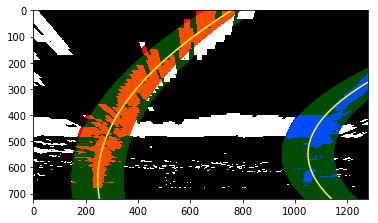

In [22]:
processed_img = np.any(process(img), axis=-1)
# plt.imshow(processed_img.astype(np.float32), cmap='gray')
left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lands_with_fit_poly(processed_img.astype(np.uint8),
                                                                                       left_fit, right_fit)
plt.imshow(out_img)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

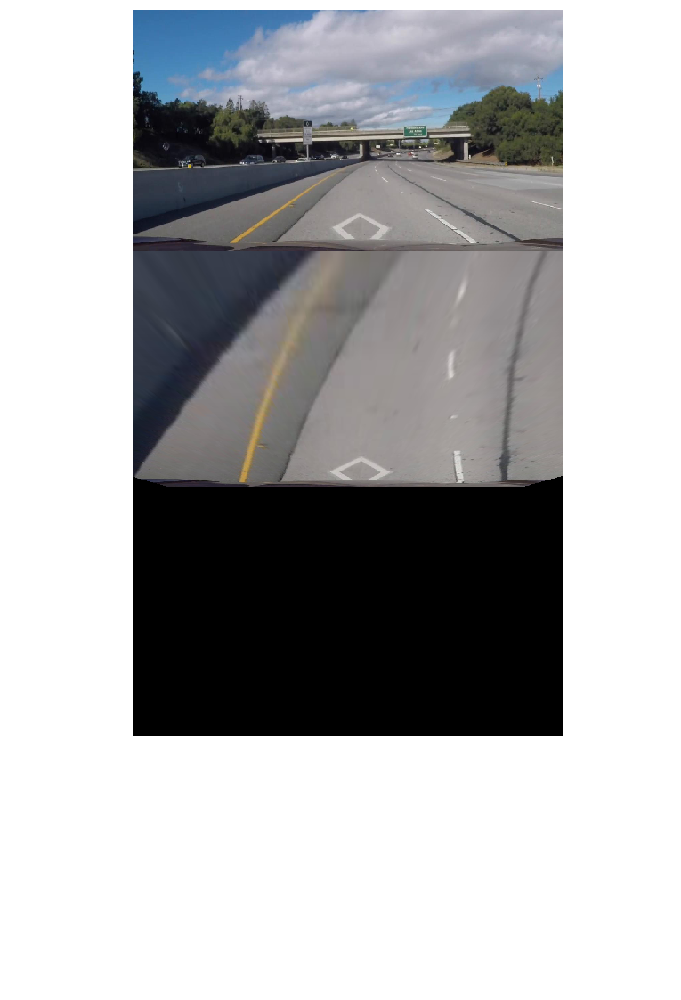

In [171]:

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

for img_name in glob('extra_test/extra_*.jpg'):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 20))
    f.subplots_adjust(left=0.0, right=1,hspace=0.001, wspace=0.001) 

    img = cv2.imread(img_name)
    b,g,r = map(clahe.apply,cv2.split(img))
    img = cv2.merge((b,g,r))
    imgRGB = RGB(img)
    birdeye_img = birdeye(imgRGB)
    ax1.imshow(imgRGB)
    ax2.imshow(birdeye_img)
    
    processed_img = np.any(process(img), axis=-1)
#     processed_img = process(img)[:,:,1]
    left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lanes_with_sliding_windows(
        processed_img.astype(np.uint8),
    )    
#     left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lands_with_fit_poly(processed_img.astype(np.uint8), left_fit, right_fit)
    ax3.imshow(out_img)
    ax3.plot(fit_leftx, fity, color='yellow')
    ax3.plot(fit_rightx, fity, color='yellow')
    ax3.set_xlim([0, 1280])
    ax3.set_ylim([720, 0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(processed_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([fit_leftx, fity]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, fity])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistort(img), 1, newwarp, 0.3, 0)
    ax4.imshow(RGB(result))

    ax3.imshow(processed_img, cmap='gray')

    
    for ax in [ax1, ax2, ax3, ax4]: ax.axis('off')
#     f.tight_layout()


In [ ]:
img = cv2.imread('extra_test/extra_test1.jpg')
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
b,g,r = map(clahe.apply, cv2.split(img))
h,l,s = cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2HLS))

img2 = cv2.merge((b,g,r))


In [ ]:
plt.imshow(s, cmap='gray')
plt.figure()
plt.imshow(clahe.apply(s), cmap='gray')

(-0.5, 1279.5, 719.5, -0.5)

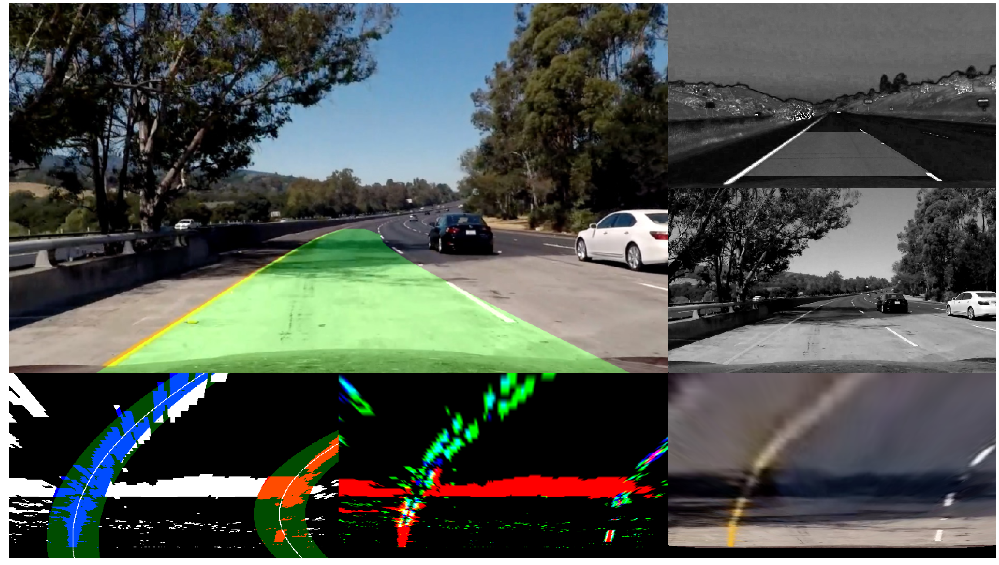

In [32]:
## clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

def aaa(img):
#     fig = plt.figure(figsize=(62,36))

#     gs = gridspec.GridSpec(2,2,width_ratios=[2,1], height_ratios=[2,1], hspace=0.001, wspace=0.001)

#     gs00 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[1], hspace=0.001, wspace=0.001)
#     gs01 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[2], hspace=0.001, wspace=0.001)


#     ax0 = plt.Subplot(fig, gs[0])
#     ax1 = plt.Subplot(fig, gs00[0])
#     ax2 = plt.Subplot(fig, gs00[1])
#     ax3 = plt.Subplot(fig, gs[3])
#     ax4 = plt.Subplot(fig, gs01[0])
#     ax5 = plt.Subplot(fig, gs01[1])

#     img0 = img.copy()
#     hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
#     l2 = clahe.apply(hls[:,:,1])
#     hls[:,:,1] = l2
    
#     img = cv2.cvtColor(hls, cv2.COLOR_HLS2BGR)


    birdeye_img = birdeye(img)

    processed_img_3D = process(img)
    processed_img = np.any(processed_img_3D, axis=-1)
    
    out_img = img.copy()

    left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lanes_with_sliding_windows(processed_img.astype(np.uint8))    
    left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lands_with_fit_poly(processed_img.astype(np.uint8), left_fit, right_fit)
    
    cv2.polylines(out_img, [np.int_(list(zip(fit_leftx, fity)))], False, (255,255,255), thickness=2)
    cv2.polylines(out_img, [np.int_(list(zip(fit_rightx, fity)))], False, (255,255,255), thickness=2)
    

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(processed_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([fit_leftx, fity]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, fity])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    result = cv2.addWeighted(undistort(img), 1, newwarp, 0.3, 0)
    
    processed_img_3D = (processed_img_3D*255).astype(np.uint8)
    h_channel = cv2.cvtColor(hls[:,:,0], cv2.COLOR_GRAY2BGR)
    l_channel = cv2.cvtColor(hls[:,:,1], cv2.COLOR_GRAY2BGR)
    s_channel = cv2.cvtColor(hls[:,:,2], cv2.COLOR_GRAY2BGR)
    r_channel = cv2.cvtColor(img[:,:,1], cv2.COLOR_GRAY2BGR)
    
    right = np.vstack([cv2.resize(s_channel,(426,240)), cv2.resize(r_channel,(426,240))])
    top = np.hstack([cv2.resize(result, (854,480)), right])
    bottom = np.hstack([cv2.resize(out_img, (427,240)), 
                        cv2.resize(processed_img_3D, (427,240)), 
                        cv2.resize(birdeye_img, (426,240))])
    combined = np.vstack([top,  bottom])

#     ax0.imshow(RGB(result))
#     ax1.imshow(hls[:,:,1], cmap='gray')
#     ax2.imshow(hls[:,:,2], cmap='gray')
#     ax3.imshow(birdeye_img)
#     ax4.imshow(RGB(processed_img3D*255))
#     ax5.imshow(out_img)
    
#     np.concatenate()

#     for ax in [ax0, ax1, ax2, ax3, ax4, ax5]: ax.axis('off')
#     for ax in [ax0, ax1, ax2, ax3, ax4, ax5]: fig.add_subplot(ax)

#     # If we haven't already shown or saved the plot, then we need to
#     # draw the figure first...
#     fig.canvas.draw()

#     # Now we can save it to a numpy array.
#     data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
#     data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    
    return combined

plt.figure(figsize=(64,36))
aaaa = aaa(cv2.imread('test_images/test5.jpg'))
plt.imshow(RGB(aaaa))
plt.axis('off')

In [ ]:
list(zip(range(5), range(5)))

In [ ]:
processed_img.shape

In [ ]:
def overlay_dectected_track(img):
    birdeye_img = birdeye(undistort(img))
    processed_img = np.any(process(img), axis=-1)
    left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lanes_with_sliding_windows(processed_img.astype(np.uint8))    
    left_fit, right_fit, out_img, (fity, fit_leftx, fit_rightx) = find_lands_with_fit_poly(processed_img.astype(np.uint8), left_fit, right_fit)
    
    warp_zero = np.zeros_like(processed_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([fit_leftx, fity]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, fity])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result #(process(img)*255).astype(np.uint8)


  

In [ ]:
plt.imshow(birdeye_img)
plt.imshow(overlay_dectected_track(img))

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

white_output = 'white.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(aaa) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('challenge_video.mp4'))

In [ ]:
clip1.save_frame("extra_test/extra_test1.jpg", t=1.5) # frame at time t=1h


In [ ]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def sanity_check(self, newfit):
        return True
        
    def update(self, newfit):
        if not (newfit and self.sanity_check(newfit)):
            self.detected = False
            return
        
        self.recent_xfitted